<a href="https://colab.research.google.com/github/kubesj/learning-python/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# Upload the data
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

# End-to-end Multi-class Dog Breed Clasification

This notebook builds an end-to-ent multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I am sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we are using is from Kaggle's dog breed identification competeition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilites for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We are dealing with images (unstructured data) so it is probably best we use deep learning/transfer learning.
* The are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10 000+ images in the training set (these images have labels)
* There are around 10 000+ images in the test set (these images have no labels. because we want to predict them).

### Get workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we are using a GPU

In [32]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version', hub.__version__)

# Check for GPU availability
print('GPU','available (YES!)' if tf.config.list_physical_devices('GPU') else 'not available :(')

TF version: 2.12.0
TF Hub version 0.13.0
GPU not available :(


## Getting our data ready (turning it into Tensors)

With all machine learning models, our data has to be in numerical format. So that is what we will be doing first. Turning our images to Tensors (numerical representation).

Let's start by accesing our data and checking out the labels.

In [33]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/Dog Vision/labels.csv')
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

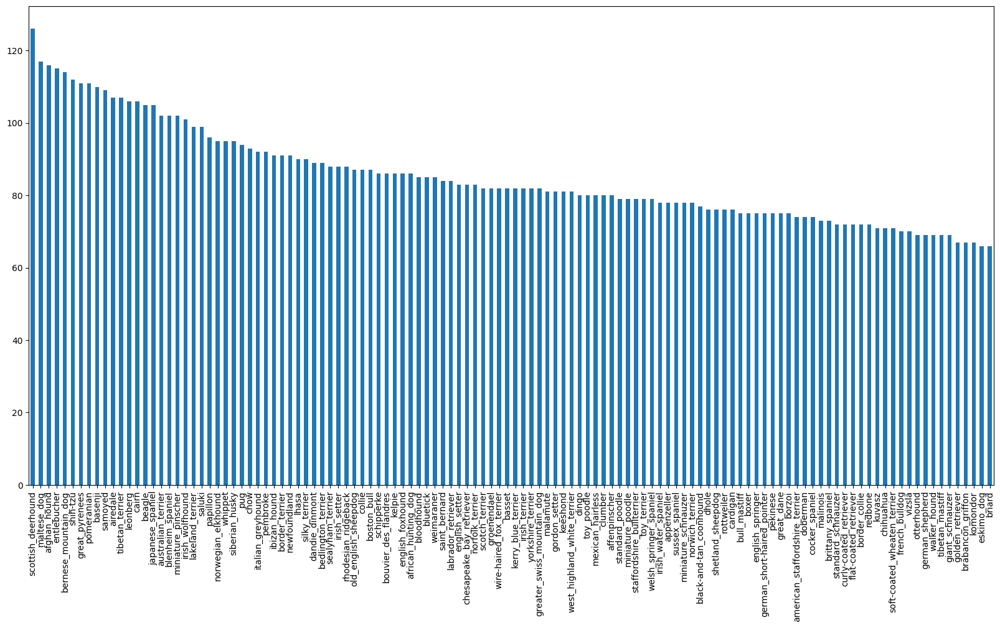

In [34]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [35]:
labels_csv['breed'].value_counts().median()

82.0

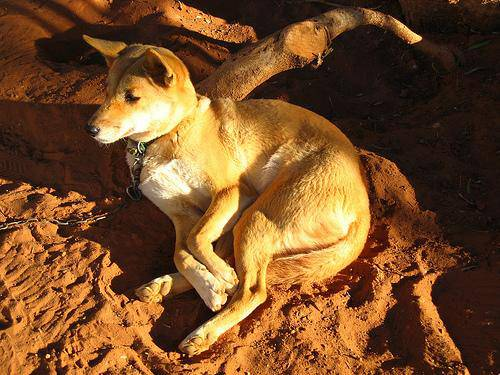

In [7]:
# Let's view an image
from IPython.display import Image
Image('drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their lables

Let's get a list of all of our image file pathnames.

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [36]:
# Create pathnames from image ID's
filenames = ['drive/MyDrive/Dog Vision/train/'+fname+'.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [37]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/Dog Vision/train/')) == len(filenames):
  print('Filenames match actual amount of files!!! Proceed.')
else:
  print('Filenames do not match actual amount of files, check the target directory')


Filenames match actual amount of files!!! Proceed.


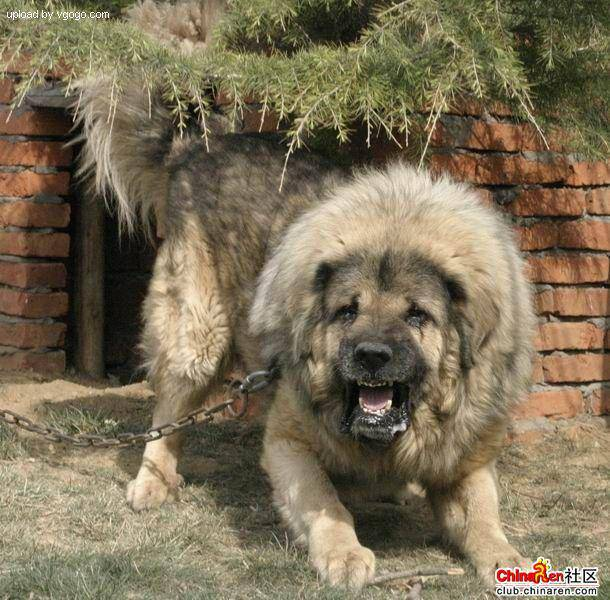

In [11]:
# One more check
Image(filenames[9000])

In [12]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we have now our training image filepaths in a list, let's prepare our labels.

In [39]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames!')
else:
  print('Number of labels does not match number of filenames, check data directories!')

Number of labels matches number of filenames!


In [40]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds), unique_breeds

(120,
 array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter'

In [17]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

In [20]:
# Example: Turning boolean array into intergers
print(labels[0])  # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
print(labels[2]) # index where label occurs in boolean array
print(boolean_labels[2].astype(int)) # there will be a 1 where the sample label occurs

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle does not come with a validation set, we are going to create our own

In [23]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [24]:
len(filenames)

10222

We are going to start off experimenting with 1000 images and increase as needed.

In [25]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type: 'slider', min:1000, max:10000,step:1000}

In [26]:
#Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [27]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we are going to write a function which does a feew things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Resize the 'image' to be a shape of (224,224)
5. Return the modified 'image'

Before e do, let's see what importing an image looks like.

In [28]:
# Convert image to NumPy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [29]:
image.max(), image.min()

(255, 0)

In [30]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [31]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we have seen what an image looks like as a Tensor, let's make a function to preprocess them. 

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the 'image' to be a shape of (224,224)
6. Return the modified 'image'

In [10]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turns the image into a Tensor.
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)

  #Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channels values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value(224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image



## Turning our data into batches

Why turn our data into batches?

Let's say you are trying to process, 10000+ images in one go, they all might not fit into memory.

So that's why we do about 32 images (this is batch size) at a time (you can manually adjust the batch size if needed)

In order to use TensorFlow effectively, we need our data in the form odf Tensor tuples which look like this:

(image, label)

In [33]:
#Create a simple funcion to return a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the associated label, processes the image and returns a tuple of (image, label)
  '''
  image = process_image(image_path)
  return image, label

In [34]:
# Demo of the above
process_image(X[42]), tf.constant(y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have a way to turn our data into tuples of Tensors in the form: (image, label), let's make a function to turn all of our data (X and y) into batches.

In [4]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles tha data if it's training data but does not shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''

  # If the data is a test dataset, we probably do not have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we do not need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch



In [36]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [37]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

OUr data is now in batches, however, these can be a little hard to understand/comprehend), let's visualize them

In [38]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''
  # Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')


In [39]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

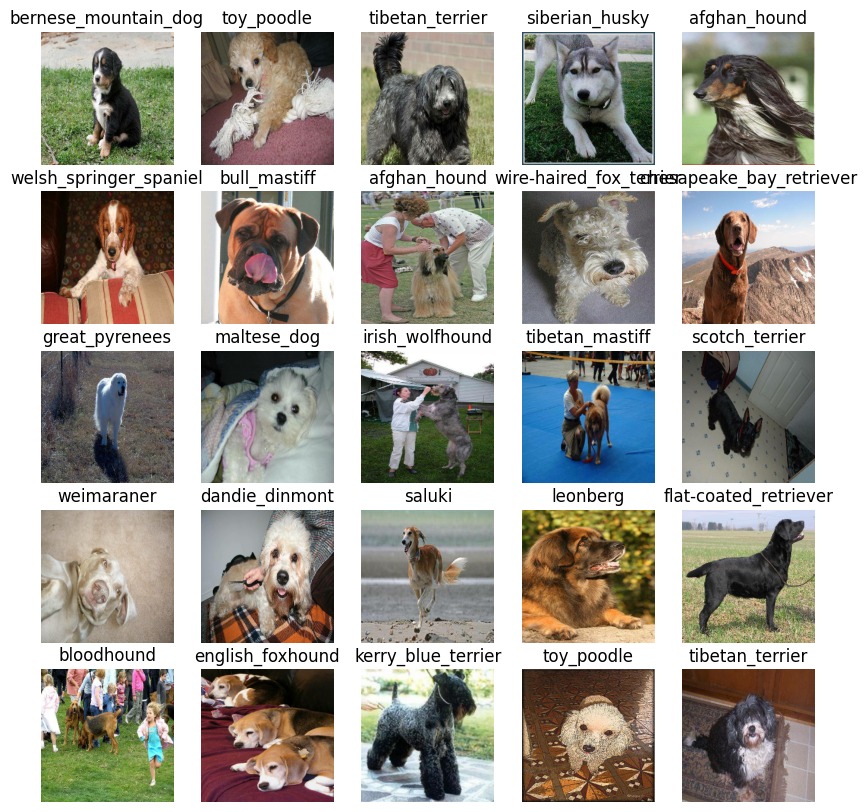

In [40]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

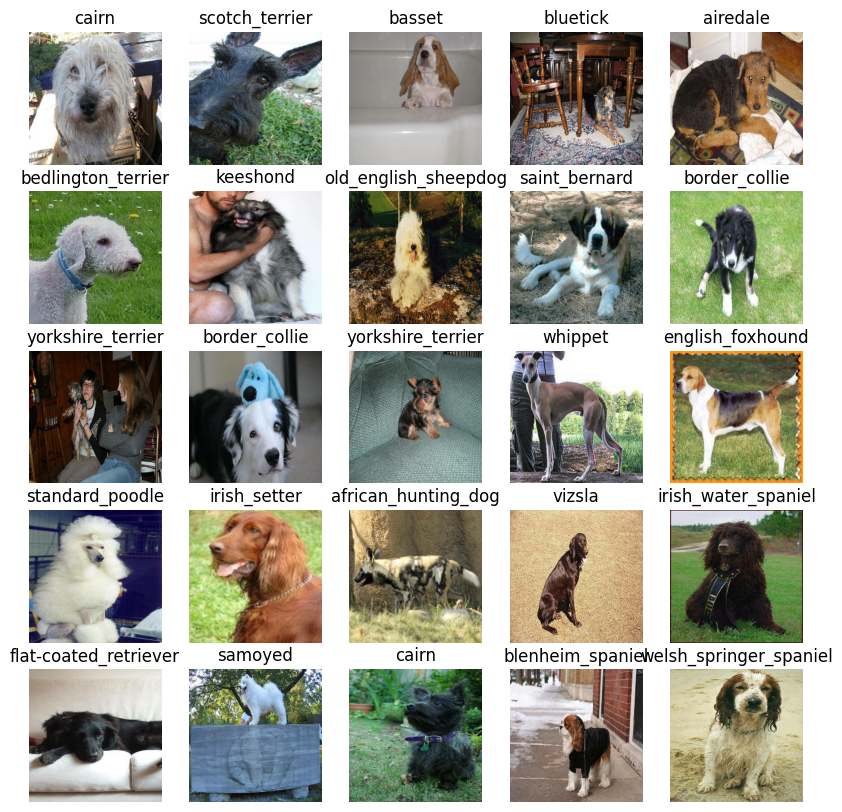

In [41]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4. -- currently https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5 is available, but we use 4.


Models sources:
* https://paperswithcode.com/
* https://www.tensorflow.org/hub
* https://modelzoo.co/
* https://pytorch.org/hub/


In [170]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TEnsorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

Now we have our inpusts, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, outputshape and the model we have chosen as parameters.
* Defines the layer in a Keras model in a sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it will be getting).
* Returns the model

All of these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model.

In [171]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, outpust_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation='softmax') # Layer 2 (output layer)
  ])

  # COmpile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [172]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_8 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_8 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [173]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We will create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. CReate a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize our models training logs with the %tensorboard magic function (we will do this after model training).


In [174]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [175]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Dog Vision/logs',
                        #Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certaion evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping



In [176]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)


## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [177]:
NUM_EPOCHS = 100 #@param {type:'slider',min:10, max:100, step:10}

In [178]:
# Check to make sure we are still running on a GPU
print('GPU','available (YES!)' if tf.config.list_physical_devices('GPU') else 'not available:(')

GPU available (YES!)


Let's create a function which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we would like to use
* Return the model

In [179]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version
  '''
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [180]:
# Fit model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 7s 142ms/step - loss: 4.6718 - accuracy: 0.0763 - val_loss: 3.3225 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 4s 173ms/step - loss: 1.6798 - accuracy: 0.6600 - val_loss: 2.0932 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 4s 140ms/step - loss: 0.5805 - accuracy: 0.9337 - val_loss: 1.5909 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 3s 124ms/step - loss: 0.2539 - accuracy: 0.9912 - val_loss: 1.4588 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 3s 120ms/step - loss: 0.1481 - accuracy: 0.9987 - val_loss: 1.3788 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 162ms/step - loss: 0.1016 - accuracy: 0.9987 - val_loss: 1.3460 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================

**Question:** It look like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neaurel networks?

**Note:** Overfitting to begin with is a good thing. It means our model is learning!

### Checking the TensorBoard logs

The TensorBoard magic function (%tensorboard) will acces the logs directory we created earlier and visualize its contents.

In [183]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [184]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [185]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data,
                            verbose=1)
predictions

7/7 [==============================] - 41s 92ms/step


array([[6.53201365e-04, 1.50871361e-04, 4.29231965e-04, ...,
        6.92361151e-04, 3.12625816e-05, 1.16338925e-02],
       [9.79834818e-04, 7.65133300e-04, 2.06602141e-02, ...,
        2.87023926e-04, 1.92986662e-03, 9.22263134e-05],
       [4.04015236e-06, 2.41835369e-05, 1.41289991e-06, ...,
        2.89406034e-06, 2.36639353e-05, 1.34925385e-05],
       ...,
       [8.22646780e-06, 2.35846401e-05, 3.13571072e-05, ...,
        5.35757954e-06, 1.59501084e-04, 1.94695513e-05],
       [2.32225866e-03, 3.23714776e-05, 5.58138650e-04, ...,
        1.42658959e-04, 3.13721612e-05, 1.31109022e-02],
       [1.68418192e-04, 2.48097658e-05, 3.32848751e-04, ...,
        1.15505385e-03, 3.00721440e-04, 6.81965830e-05]], dtype=float32)

In [186]:
np.sum(predictions[0])

1.0

In [187]:
# First prediction
index = 0
print(predictions[index])
print(f'Max value (probability of prediction) {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[6.53201365e-04 1.50871361e-04 4.29231965e-04 6.25578250e-05
 3.02219793e-04 6.78541473e-05 6.25521271e-03 5.53097168e-04
 4.92232975e-05 1.32893410e-03 4.96528111e-04 6.58936260e-05
 2.77265179e-04 7.52027336e-05 4.76408663e-04 6.56490680e-04
 3.94894341e-05 1.69199958e-01 3.78918194e-05 5.92229044e-05
 2.81792367e-03 1.61241755e-04 3.75909112e-05 7.95906351e-04
 1.70774038e-05 2.95540813e-04 2.97977298e-01 7.53905842e-05
 4.67738864e-04 1.55023576e-04 1.18554577e-04 6.46407309e-04
 5.03370713e-04 6.29591814e-05 1.60151510e-04 3.17595489e-02
 9.39175734e-05 3.12521188e-05 8.27337772e-06 4.62727097e-04
 1.29049574e-03 3.98645243e-05 1.52043271e-04 2.39349720e-05
 5.06062970e-05 3.93848713e-05 2.72137513e-05 1.28677624e-04
 7.01971701e-04 2.21510545e-05 1.25461360e-04 7.19069867e-05
 3.54479940e-04 2.33062339e-04 4.44592210e-04 1.63550561e-04
 9.99365511e-06 9.04818065e-03 4.65299199e-05 4.56233285e-02
 1.28063245e-03 3.27134971e-04 6.28532097e-03 2.15705950e-05
 2.45711859e-03 1.816653

In [188]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Having the above functionality is great but we want to be able to do it at scale.

And it would be event better if we could see the image the prediction is being made of.

**Note:** Prediction probabilities are also known as confidence levels.

In [56]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of array of prediction probabilities
pred_label = get_pred_label(predictions[100])
pred_label

In [190]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we will have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [191]:
#Create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  '''
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbtachify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We will create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [192]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the predition, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # PLot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
            color=color)


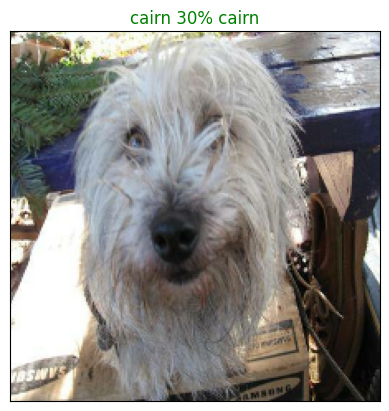

In [194]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n=0)

No we have one function to visualizue our models top predictions, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_pred_label()
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [200]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted labels
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

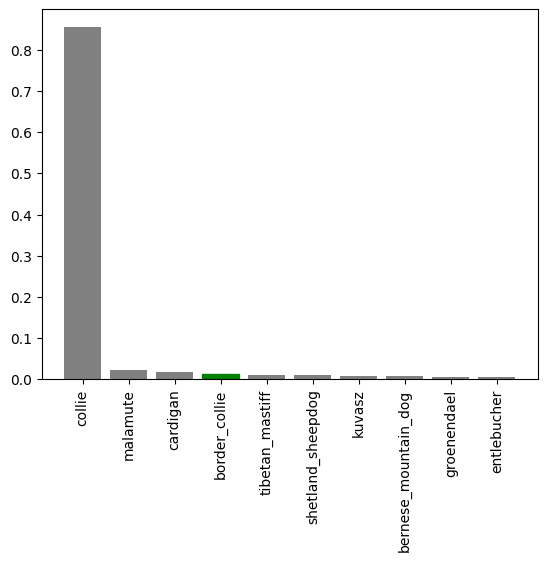

In [201]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

No we have some functions to help us visualize our predictions and evaluate our model, let's check out a few.

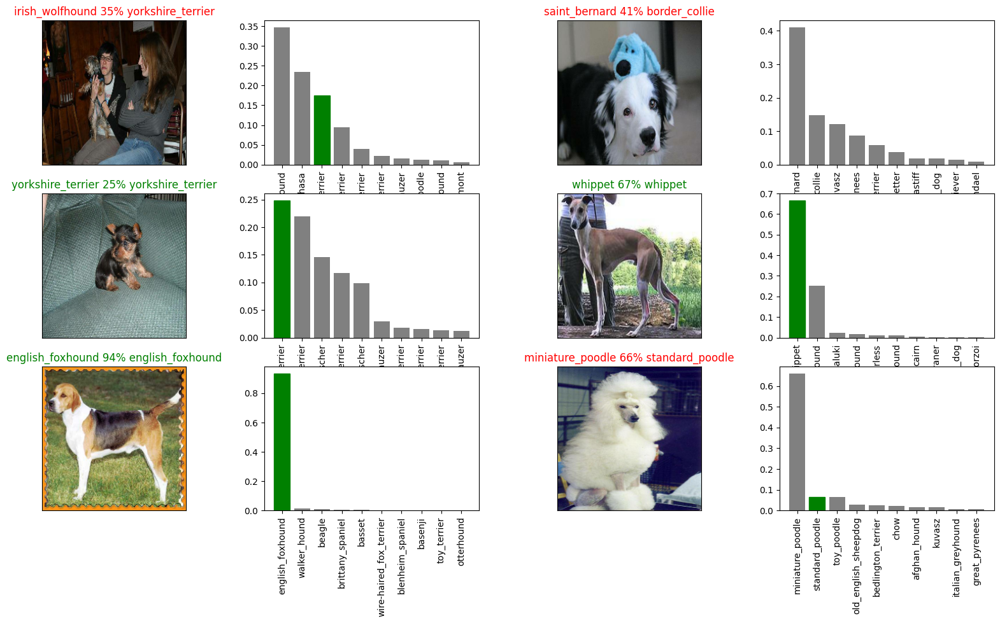

In [202]:
#Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_cols))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
# plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model

In [223]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a models directory and appends a suffix (string).
  '''

  # Create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/Dog Vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5'
  print(f'Saving model to: {model_path}...')
  model.save(model_path)

  return model_path



In [15]:
# Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

Now we have functions to save and load model, let's make sure they work!

In [225]:
#Save our model trained on 1000 images
save_model(model, suffix = '1000-images-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Dog Vision/models/20230423-12001682251254-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20230423-12001682251254-1000-images-mobilenetv2-Adam.h5'

In [226]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog Vision/models/20230423-12001682251254-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20230423-12001682251254-1000-images-mobilenetv2-Adam.h5


In [227]:
# Evaluate the pred-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 129ms/step - loss: 1.2400 - accuracy: 0.6550


[1.2400470972061157, 0.6549999713897705]

In [228]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 3s 205ms/step - loss: 1.2400 - accuracy: 0.6550


[1.2400470972061157, 0.6549999713897705]

##Training a dog model (on the full data)

In [229]:
len(X), len(y)

(10222, 10222)

In [233]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [234]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [235]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [236]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cannot monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the gpu we are using in the runtime has to load all of the images into memory.

In [237]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])



Epoch 1/100
320/320 [==============================] - 3321s 10s/step - loss: 1.3476 - accuracy: 0.6721
Epoch 2/100
320/320 [==============================] - 34s 107ms/step - loss: 0.4061 - accuracy: 0.8815
Epoch 3/100
320/320 [==============================] - 36s 111ms/step - loss: 0.2364 - accuracy: 0.9341
Epoch 4/100
320/320 [==============================] - 34s 105ms/step - loss: 0.1557 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 35s 109ms/step - loss: 0.1062 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0782 - accuracy: 0.9854
Epoch 7/100
320/320 [==============================] - 36s 111ms/step - loss: 0.0594 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 36s 111ms/step - loss: 0.0464 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 36s 111ms/step - loss: 0.0386 - accuracy: 0.9955
Epoch 10/100
320/320 [==============================] - 34s 106m

In [238]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Dog Vision/models/20230423-13201682256015-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20230423-13201682256015-full-image-set-mobilenetv2-Adam.h5'

In [16]:
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/models/20230423-13201682256015-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20230423-13201682256015-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we will have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we will:
* Get the test image filenames
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data does not have labels).
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [17]:
# Load test image filenames
import os
test_path = '/content/drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/df58b248e14af15c43fb4a3ebc00e9a3.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e383a31009f0779536d43816c10bf662.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e330d9cfe81e42338ddbf8a121930e83.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e64296ffbae301f86c8728834c507cb6.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e35b90290702042d17ceee2aaf2d1475.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e4e71046e4dce90d4b4790e9819d2d82.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e60f6620bf8751538db9006d425f1b45.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dcddc9135d0a138bb83a55bbc06adacc.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e5de4eec61d00ee4834ff0153f90ed41.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e141811c20cade75f5cb3b7da86320a8.jpg']

In [18]:
len(test_filenames)

10357

In [19]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [20]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling predict() on our full model and passing it the test data batch will take a long time to run (about an 1 hour).

In [21]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 837s 3s/step


In [26]:
import numpy as np
np.savetxt('/content/drive/MyDrive/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [27]:
test_predictions = np.loadtxt('/content/drive/MyDrive/Dog Vision/preds_array.csv', delimiter=',')

In [28]:
test_predictions[:10]

array([[9.23399150e-01, 2.10498077e-10, 5.92282348e-08, ...,
        3.46654372e-10, 4.84949680e-07, 6.16541542e-02],
       [2.08022453e-08, 1.20170873e-09, 2.26365315e-10, ...,
        2.76862466e-09, 2.06336299e-08, 1.58216125e-07],
       [1.23851365e-08, 1.04255905e-12, 2.76524137e-10, ...,
        3.57152641e-10, 2.65098481e-11, 3.41062734e-10],
       ...,
       [3.39011983e-08, 3.40576323e-09, 5.42551837e-10, ...,
        3.30868492e-11, 7.42221395e-10, 2.14572040e-08],
       [2.19158358e-10, 6.75721699e-03, 5.62288065e-08, ...,
        3.47201349e-05, 2.16867302e-09, 2.70451369e-06],
       [2.13175717e-08, 3.38471109e-05, 9.06642981e-06, ...,
        1.20844800e-06, 1.13012462e-08, 7.96599693e-08]])

In [29]:
test_predictions.shape

(10357, 120)

##Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we will:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.


In [41]:
# Create a pandas DataFrame with empty columns
import pandas as pd
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [42]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [43]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df58b248e14af15c43fb4a3ebc00e9a3,9.233992e-01,2.104981e-10,5.922823e-08,1.209199e-10,2.443804e-11,2.006642e-09,4.776471e-07,1.597962e-10,2.478107e-11,...,7.827946e-08,8.293007e-06,2.844674e-09,1.462172e-09,1.500057e-08,1.028417e-10,1.334213e-07,3.466544e-10,4.849497e-07,6.165415e-02
1,e383a31009f0779536d43816c10bf662,2.080225e-08,1.201709e-09,2.263653e-10,1.525266e-09,1.153620e-08,4.016002e-10,1.288107e-07,8.914229e-09,1.324417e-08,...,7.551541e-01,5.266282e-07,3.232422e-08,1.866302e-09,2.672983e-08,3.333443e-10,1.645005e-06,2.768625e-09,2.063363e-08,1.582161e-07
2,e330d9cfe81e42338ddbf8a121930e83,1.238514e-08,1.042559e-12,2.765241e-10,3.392725e-11,6.778957e-06,3.020666e-08,8.905264e-12,1.134850e-11,1.240014e-12,...,2.436358e-11,8.745236e-09,1.676944e-11,7.492355e-11,4.949346e-12,4.195825e-13,1.098723e-10,3.571526e-10,2.650985e-11,3.410627e-10
3,e64296ffbae301f86c8728834c507cb6,3.624573e-05,4.324064e-09,6.382461e-08,1.507107e-07,1.890353e-08,3.342852e-08,2.230870e-09,1.262690e-12,4.535654e-12,...,1.875401e-13,2.129778e-10,7.092552e-10,8.439166e-05,2.083941e-09,2.204860e-11,2.970200e-09,6.438451e-07,1.709736e-09,1.855987e-08
4,e35b90290702042d17ceee2aaf2d1475,6.844161e-07,3.686757e-09,1.931498e-06,2.657131e-07,8.819822e-07,2.282497e-10,7.102305e-05,2.246168e-07,1.605074e-07,...,1.310308e-07,1.130600e-05,1.000757e-08,3.407731e-08,5.024954e-10,1.739981e-08,1.719708e-04,5.956108e-08,6.814325e-07,1.997578e-05


In [44]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv('/content/drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv', index=False)

## Making predictions on custom images

To make predictions on custom images, we will:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom image will not have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.


In [48]:
# Get custom image filepaths
custom_path = '/content/drive/MyDrive/Dog Vision/random-dogs/'
custom_image_paths = [custom_path +fname for fname in os.listdir(custom_path)]


In [49]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/random-dogs/golden-retriever.jpg',
 '/content/drive/MyDrive/Dog Vision/random-dogs/dogs.jpg',
 '/content/drive/MyDrive/Dog Vision/random-dogs/dog.jpg']

In [50]:
# Turn custom_images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [51]:
#Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 506ms/step


In [53]:
custom_preds.shape

(3, 120)

In [57]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))] 
custom_pred_labels

['golden_retriever', 'english_foxhound', 'groenendael']

In [58]:
#Get custom images (our unbatchify() function will not worke since there are not labels)
custom_images = []
# Lopp through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

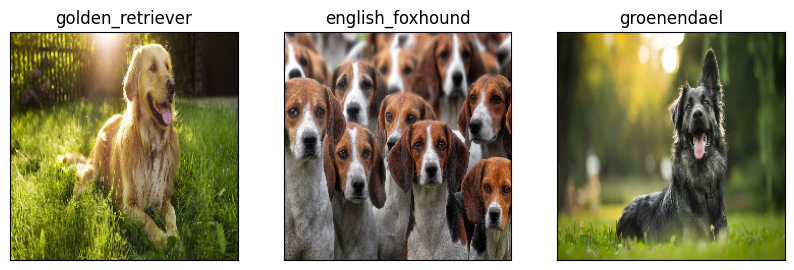

In [60]:
# CHeck custom image predictions
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)